In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import pearsonr
import seaborn as sns
import HERGAST
import torch
import torch.nn as nn
import torch.optim as optim
import anndata as ad
from tqdm import tqdm
import time
from SpaLP.utils import prepare_inputs, set_seed,create_new_color_dict,Graph
from SpaLP.LP import SpatialLocalPooling
from scipy.stats import rankdata
import random
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True 
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

plt.rcParams["figure.figsize"] = (9, 8)

# helper functions
def plot_gene_dist(adata,i,layer=None,num_bin=30,save=None):

    if layer is not None:
        df = pd.DataFrame({'value':adata.layers[layer][:,i],'mark':adata.obs['mark_area'].to_list()})
    else:
        df = pd.DataFrame({'value':adata.X[:,i],'mark':adata.obs['mark_area'].to_list()})
    
    # 设置绘图风格
    sns.set_theme(style="white")
    palette = {
    '0': '#6384BA',
    '1': '#E39C73'
    }

    plt.figure(figsize=(9, 6))
    sns.histplot(data=df, x='value', hue='mark', bins=num_bin, alpha=0.5, element='step',common_norm=False, stat='density',palette=palette)
    
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(True)
    plt.gca().spines['bottom'].set_visible(True)
    plt.legend().set_visible(False)
    plt.xlabel('')
    plt.ylabel('')

    if save is not None:
        plt.savefig(save)
    else:
        plt.show()

def min_max_norm(data):
    # Min-Max 
    min_vals = data.min(axis=0)  
    max_vals = data.max(axis=0)  
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

def compute_all_metrics(Y_true, Y_pred):
    if hasattr(Y_true, "toarray"): Y_true = Y_true.toarray()
    if hasattr(Y_pred, "toarray"): Y_pred = Y_pred.toarray()
    def vectorized_pcc(X, Y):
        X_centered = X - X.mean(axis=0)
        Y_centered = Y - Y.mean(axis=0)
        numerator = np.sum(X_centered * Y_centered, axis=0)
        denominator = np.sqrt(np.sum(X_centered**2, axis=0)) * np.sqrt(np.sum(Y_centered**2, axis=0))
        return numerator / (denominator + 1e-12) #
    
    pcc_per_gene = vectorized_pcc(Y_true, Y_pred)
    
    Y_true_ranked = np.apply_along_axis(rankdata, 0, Y_true)
    Y_pred_ranked = np.apply_along_axis(rankdata, 0, Y_pred)
    spcc_per_gene = vectorized_pcc(Y_true_ranked, Y_pred_ranked)

    return np.mean(pcc_per_gene), np.mean(spcc_per_gene),pcc_per_gene, spcc_per_gene

def error_metrics(gt_norm, pred_norm):
    # gt/pred: (N, G)
    err = pred_norm - gt_norm
    rmse = np.sqrt(np.mean(err**2))
    mae  = np.mean(np.abs(err))
    # per gene
    gene_rmse = np.sqrt(np.mean(err**2, axis=0))
    gene_mae  = np.mean(np.abs(err), axis=0)
   
    return rmse, mae, gene_rmse, gene_mae

In [2]:
set_seed(7)

================================== pattern:pattern7  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:07<00:00, 28.44it/s, Epoch=199, Loss=0.9889]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8595 (Higher is better)    | 0.3352
SPCC       | 0.5727 (Higher is better)    | 0.2474
RMSE       | 0.1139 (Lower is better)     | 0.4144
MAE        | 0.0662 (Lower is better)     | 0.3905


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern8  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.18it/s, Epoch=199, Loss=0.9941]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8000 (Higher is better)    | 0.2478
SPCC       | 0.3399 (Higher is better)    | 0.1644
RMSE       | 0.0814 (Lower is better)     | 0.4333
MAE        | 0.0495 (Lower is better)     | 0.4143


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern4  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.18it/s, Epoch=199, Loss=0.9862]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8691 (Higher is better)    | 0.3721
SPCC       | 0.6612 (Higher is better)    | 0.2941
RMSE       | 0.1350 (Lower is better)     | 0.3940
MAE        | 0.0795 (Lower is better)     | 0.3666


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern2  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.05it/s, Epoch=199, Loss=0.9888]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8580 (Higher is better)    | 0.3374
SPCC       | 0.5752 (Higher is better)    | 0.2496
RMSE       | 0.1145 (Lower is better)     | 0.4047
MAE        | 0.0668 (Lower is better)     | 0.3802


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern5  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.23it/s, Epoch=199, Loss=0.9889]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8664 (Higher is better)    | 0.3347
SPCC       | 0.5753 (Higher is better)    | 0.2462
RMSE       | 0.1142 (Lower is better)     | 0.4064
MAE        | 0.0661 (Lower is better)     | 0.3823


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern6  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.34it/s, Epoch=199, Loss=0.9890]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8516 (Higher is better)    | 0.3339
SPCC       | 0.5618 (Higher is better)    | 0.2455
RMSE       | 0.1132 (Lower is better)     | 0.4088
MAE        | 0.0656 (Lower is better)     | 0.3845


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern1  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.41it/s, Epoch=199, Loss=0.9823]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8790 (Higher is better)    | 0.4134
SPCC       | 0.7582 (Higher is better)    | 0.3564
RMSE       | 0.1607 (Lower is better)     | 0.3784
MAE        | 0.0992 (Lower is better)     | 0.3470


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern3  ===================================


Training: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:06<00:00, 31.30it/s, Epoch=199, Loss=0.9919]



Metric     | Reconstructed (SpaLP)  | Noisy Input           
------------------------------------------------------------
PCC        | 0.8295 (Higher is better)    | 0.2903
SPCC       | 0.4510 (Higher is better)    | 0.1996
RMSE       | 0.0947 (Lower is better)     | 0.4189
MAE        | 0.0559 (Lower is better)     | 0.3973


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


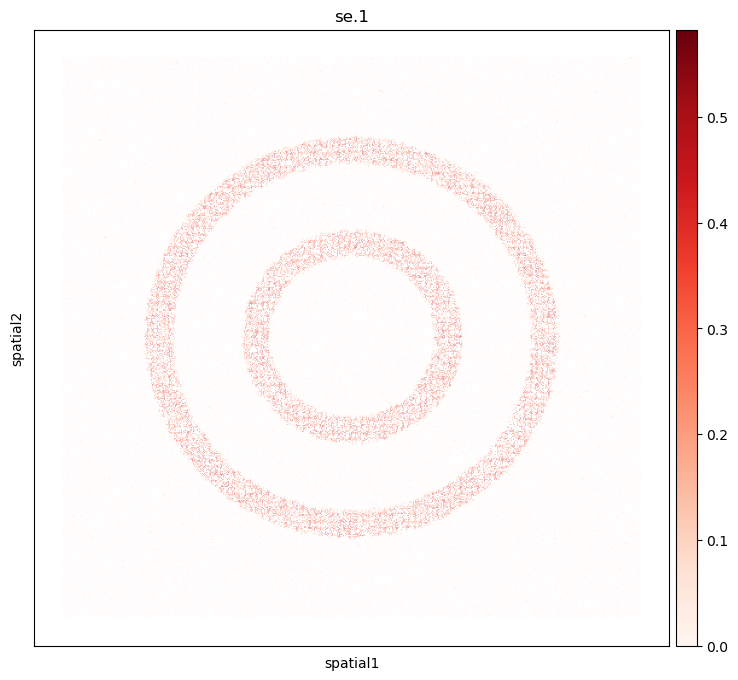

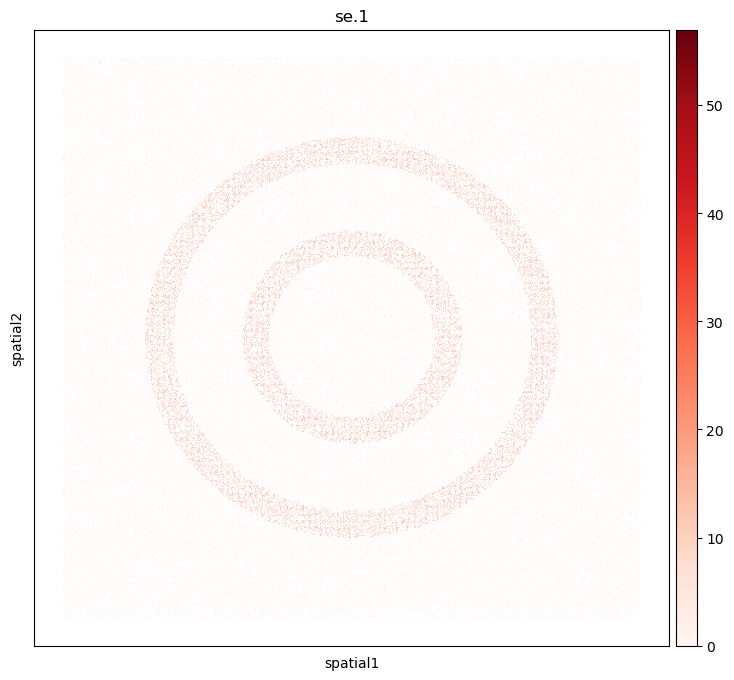

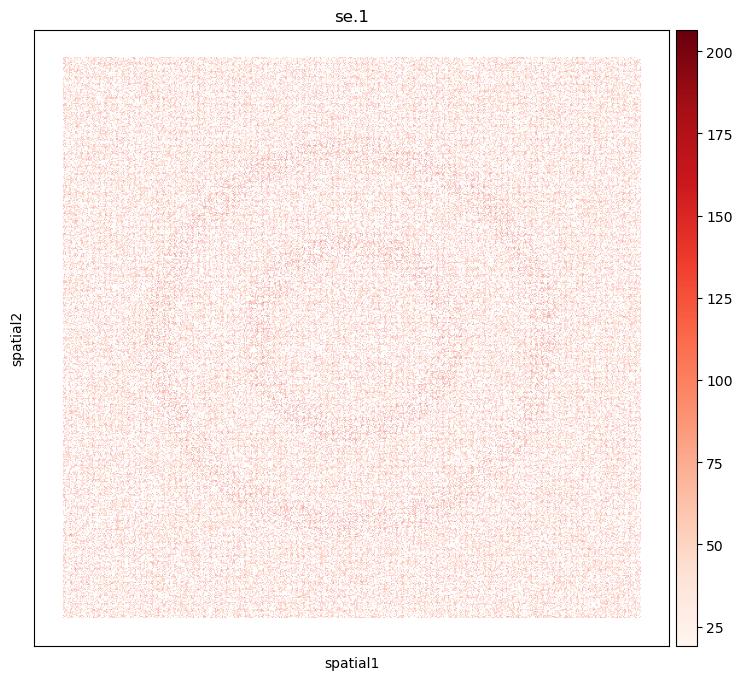

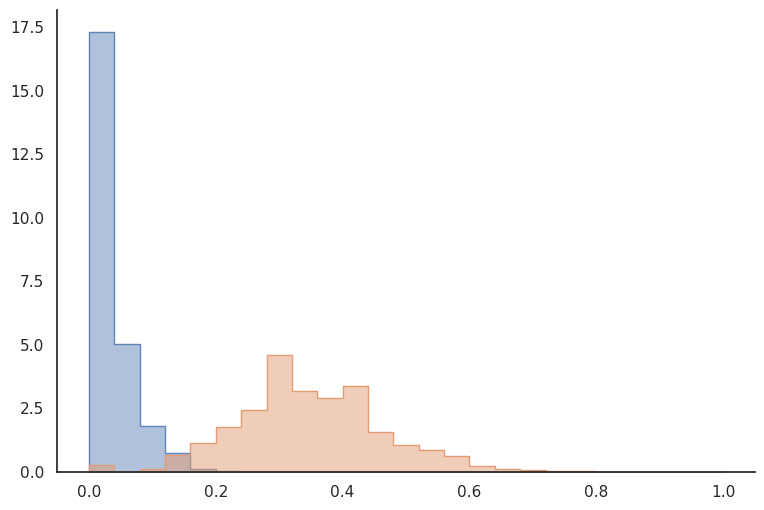

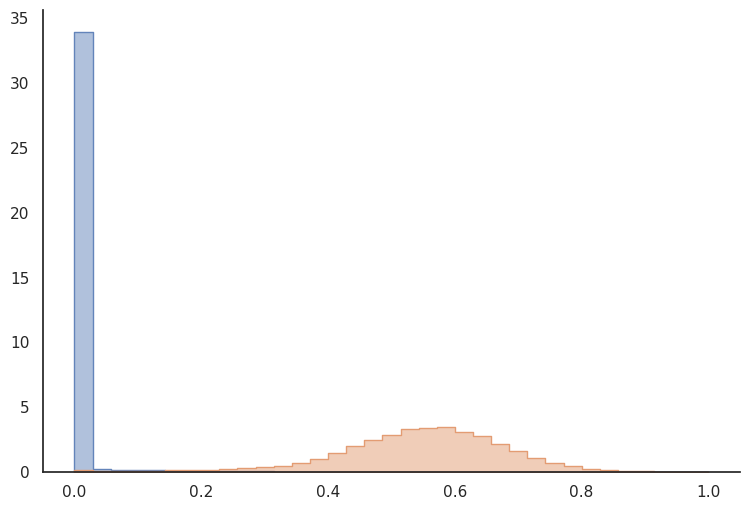

...

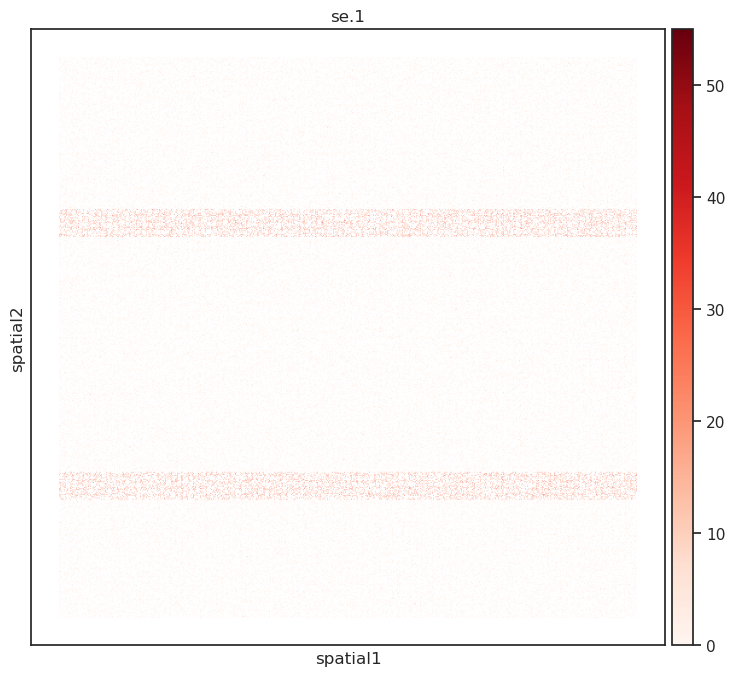

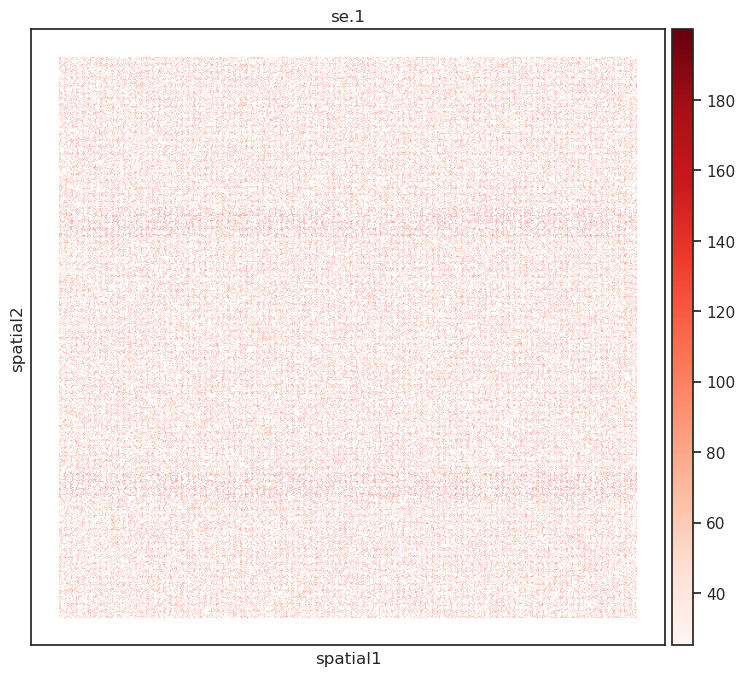

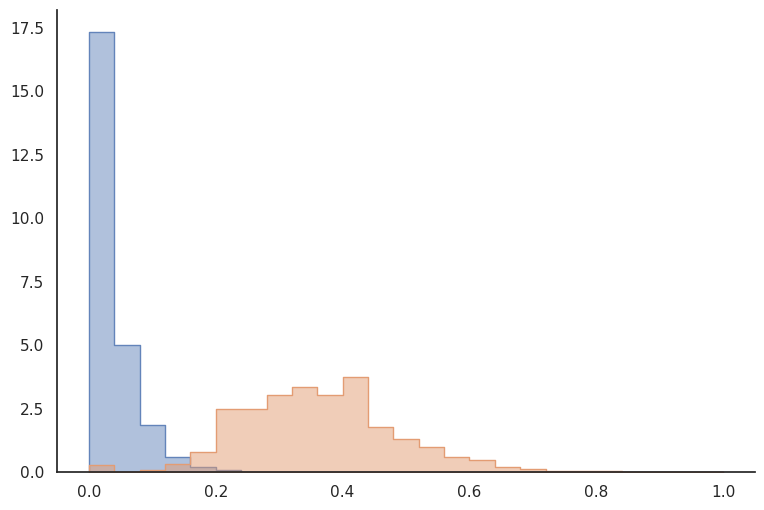

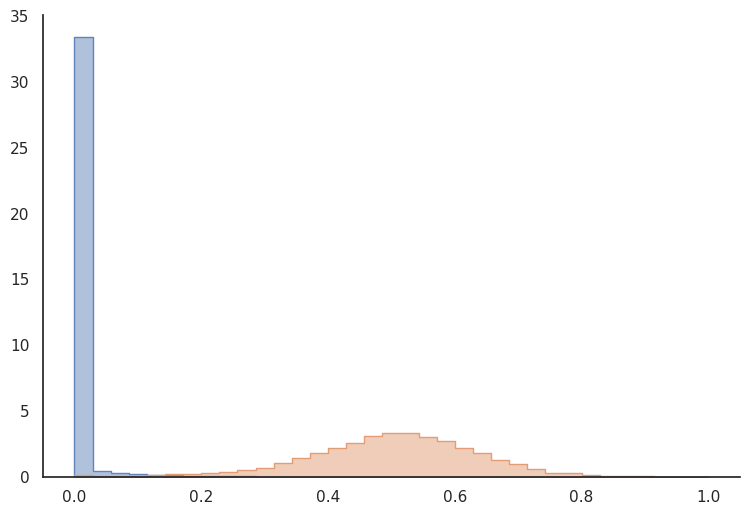

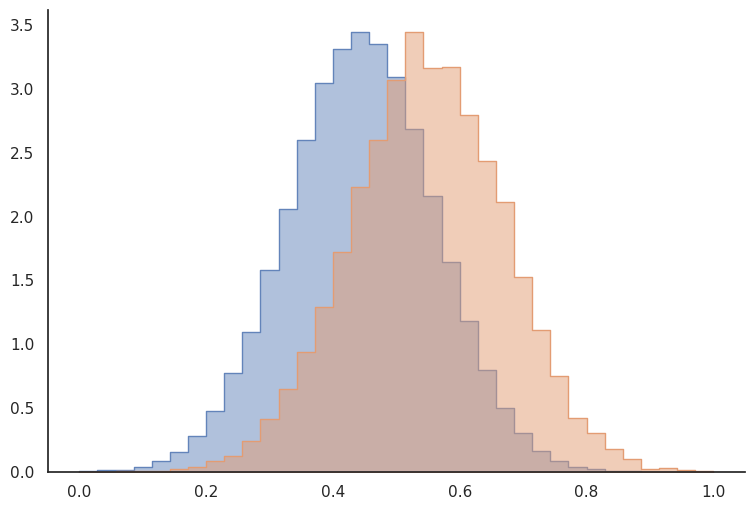

In [3]:
dist_mapping={'0':'ZIP','1':'ZINB'}
dist = dist_mapping['1']
patterns = [f for f in os.listdir('.') if f.endswith('.png')]
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
for ptn in patterns:
    res_dir = ptn.split('.')[0]
    print(f'================================== pattern:{res_dir}  ===================================')
    res_dir = f'{dist}/{res_dir}'
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    current_img_dir = '.' 
    if dist=='ZINB':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZINB',ptn=ptn,png_dir=current_img_dir, se_mu=20,se_size=20,ns_mu=2,ns_size=2,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
        mean = 20  # noise mean
        stddev = 20  # noise std
        noise = np.random.normal(mean, stddev, adata.shape)
        
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
        
    elif dist=='ZIP':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZIP',ptn=ptn,png_dir=current_img_dir, se_mu=15,ns_mu=3,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
        mean = 15  
        stddev = 15 
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
    adata.layers['noise'] = adata.X.copy()


    #SpaLP model
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    sc.pp.scale(adata)
    adata.obsm['feat']=adata.X
    
    graph = prepare_inputs(adata,k=8,device=device)
    in_channels = graph.features.shape[1]
    model = SpatialLocalPooling(in_channels, out_channels=50).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    set_seed(7)
    epochs = 200
    pbar = tqdm(range(epochs), desc="Training",ncols=200)
    for epoch in pbar:
        start_time = time.time()
        model.train()
        optimizer.zero_grad()
        reconstructed,embedding = model(graph.features, graph.neighbor_idx)
        loss = criterion(reconstructed, graph.features)
        loss.backward()
        optimizer.step()
        elapsed = time.time() - start_time
        pbar.set_postfix({"Epoch": epoch,"Loss": f"{loss.item():.4f}"})
    model.eval()
    with torch.no_grad():
        reconstructed,embedding = model(graph.features, graph.neighbor_idx)
        reconstructed = reconstructed.cpu().numpy()
        embedding=embedding.cpu().numpy()
        
    #Evaluation
    adata.layers['rex'] = reconstructed
    adata.layers['gt_norm'] = min_max_norm(adata.layers['gt'])
    adata.layers['rex_norm'] = min_max_norm(adata.layers['rex'])
    adata.layers['noise_norm'] = min_max_norm(adata.layers['noise'])
    gt_data = adata.layers['gt'][:, :50]
    rex_data = adata.layers['rex'][:, :50]
    noise_data = adata.layers['noise'][:, :50]
    
    gt_norm_data = adata.layers['gt_norm'][:, :50]
    rex_norm_data = adata.layers['rex_norm'][:, :50]
    noise_norm_data = adata.layers['noise_norm'][:, :50]
    
    
    # 2.  Reconstructed (Rex) vs Ground Truth
    rex_pcc, rex_spcc,pcc_per_gene, spcc_per_gene = compute_all_metrics(gt_data, rex_data)
    noise_pcc, noise_spcc,noise_pcc_per_gene,noise_spcc_per_gene = compute_all_metrics(gt_data, noise_data)
    rmse, mae, rmse_per_gene, mae_per_gene=error_metrics(gt_norm_data,rex_norm_data)
    noise_rmse, noise_mae, noise_rmse_per_gene, noise_mae_per_gene=error_metrics(gt_norm_data,noise_norm_data)
    
    print(f"\n{'Metric':<10} | {'Reconstructed (SpaLP)':<22} | {'Noisy Input':<22}")
    print("-" * 60)
    print(f"{'PCC':<10} | {rex_pcc:.4f}{' (Higher is better)':<22} | {noise_pcc:.4f}")
    print(f"{'SPCC':<10} | {rex_spcc:.4f}{' (Higher is better)':<22} | {noise_spcc:.4f}")
    print(f"{'RMSE':<10} | {rmse:.4f}{' (Lower is better)':<22} | {noise_rmse:.4f}")
    print(f"{'MAE':<10} | {mae:.4f}{' (Lower is better)':<22} | {noise_mae:.4f}")
    import pandas as pd

    # Rex vs GT
    rex_df = pd.DataFrame({"Methods": ["SpaLP"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": pcc_per_gene,"SPCC": spcc_per_gene,"RMSE":rmse_per_gene,"MAE":mae_per_gene,"pattern":res_dir},)
    
    # Noise vs GT
    noise_df = pd.DataFrame({"Methods": ["Noise"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": noise_pcc_per_gene,"SPCC": noise_spcc_per_gene,"RMSE":noise_rmse_per_gene,"MAE":noise_mae_per_gene,"pattern":res_dir})
    
    rex_df.to_csv(f"{res_dir}/SpaLP_rex_vs_gt_correlation.csv", index=False)
    noise_df.to_csv(f"{res_dir}/noise_vs_gt_correlation.csv", index=False)
    
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='rex',show=False)
    plt.savefig(f'{res_dir}/SpaLP_svg_sp_rex.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='gt',show=False)
    plt.savefig(f'{res_dir}/SpaLP_svg_sp_gt.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='noise',show=False)
    plt.savefig(f'{res_dir}/SpaLP_svg_sp_noise.png')

    plot_gene_dist(adata,0,num_bin=25,layer='gt_norm',save=f'{res_dir}/gt_svg_dist_gt.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='rex_norm',save=f'{res_dir}/SpaLP_svg_dist_rex.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='noise_norm',save=f'{res_dir}/Noise_svg_dist_noise.svg')